In [17]:
#* for data manipulation 
import pandas as pd 
import numpy as np 


from disk_analysis_tools import tiling_disk_plots as tdp
from disk_analysis_tools import tiling_disk_utils as tdu

#* for plotting: 
import matplotlib.pyplot as plt 
import seaborn as sns
%matplotlib inline
sns.set_theme(style="ticks")
sns.set_context("talk", )
#

# triplets v4 experiment analysis

In [18]:
exp_db = tdu.query_exp_db()

In [19]:
exp_id = 22
exp_db.loc[exp_db.exp_id == exp_id].exp_description.values[0]

'triplets v4: blue: v=5.5mm/s; brown: v=7.2mm/s; yellow: v=9.0mm/s; pink tip '

In [20]:
meta_data = tdu.fetch_meas_metadata(exp_id=exp_id)
meta_data

,measurement_id,exp_id,date,file_name,material,process_step,vac_mapping,coordinates,meas_cap_status,comments
0,120,22,10.03.2022,20220310_trip_v4_pink_slow_bfg_novac.txt,steel,before_glue,"[1,1000]",coordinate-blue-brown-yellow.txt,1,reference for triplets v4 -> pink tip & slow
1,121,22,10.03.2022,20220310_trip_v4_pink_slow_curing.txt,steel,curing,"[n,1000]",coordinate-blue-brown-yellow.txt,1,curing process


In [21]:
meas_id_bg = 120
meas_id_sig = 121

20220310_trip_v4_pink_slow_bfg_novac.txt
Reading data...
Reading done
control plots precut
control plots post
20220310_trip_v4_pink_slow_curing.txt
Reading data...
Reading done
control plots precut
control plots post
Background Data:
Total points removed: 619
Total points removed: 0.09%
Signal Data:
Total points removed: 878
Total points removed: 0.13%
Background Data:
Total points removed: 619
Total points removed: 0.09%
Signal Data:
Total points removed: 604
Total points removed: 0.09%
Background Data:
Total points removed: 619
Total points removed: 0.09%
Signal Data:
Total points removed: 675
Total points removed: 0.10%
Background Data:
Total points removed: 619
Total points removed: 0.09%
Signal Data:
Total points removed: 663
Total points removed: 0.09%
Background Data:
Total points removed: 619
Total points removed: 0.09%
Signal Data:
Total points removed: 728
Total points removed: 0.10%
Background Data:
Total points removed: 619
Total points removed: 0.09%
Signal Data:
Total poi

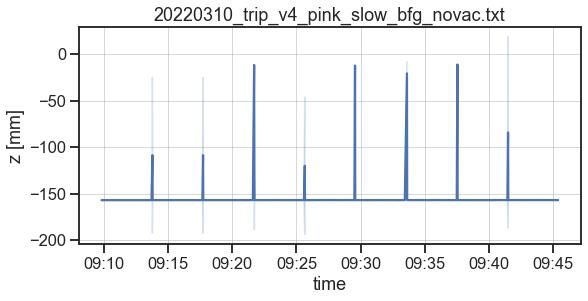

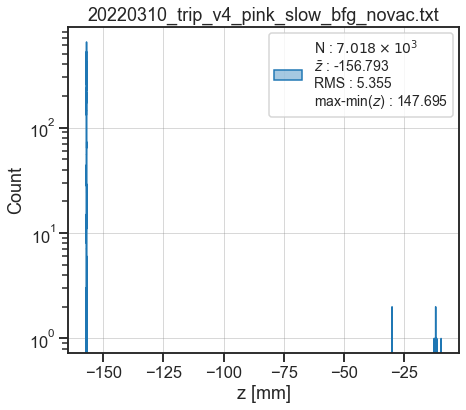

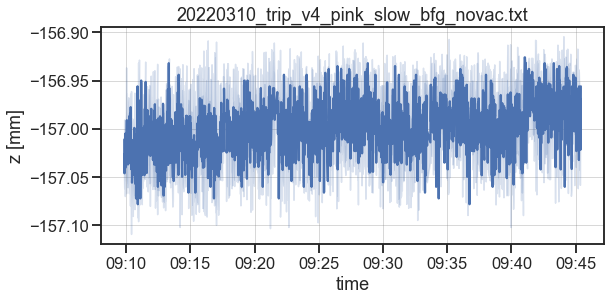

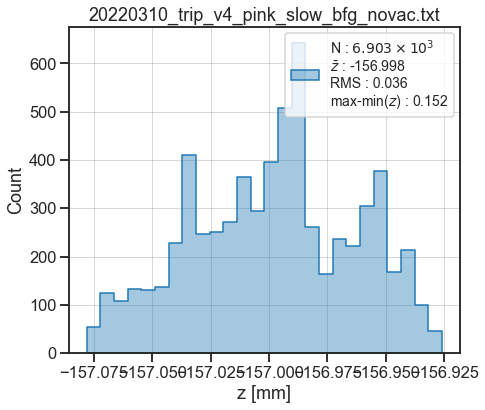

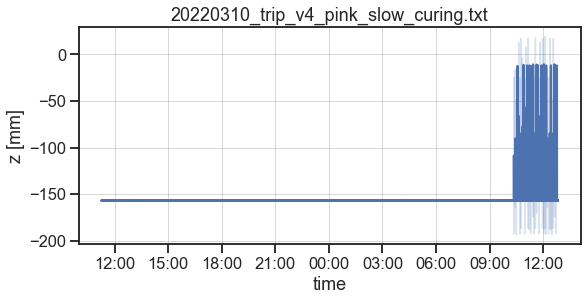

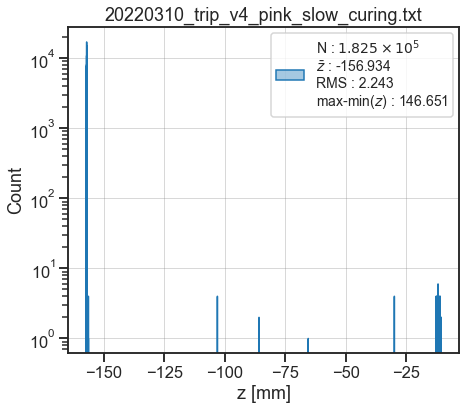

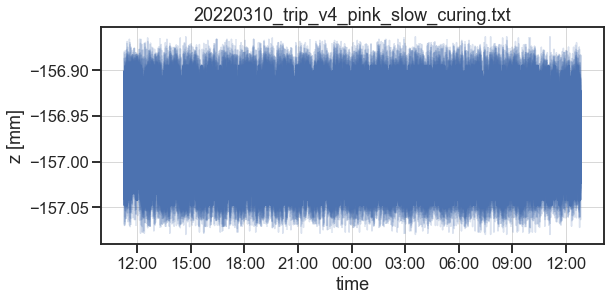

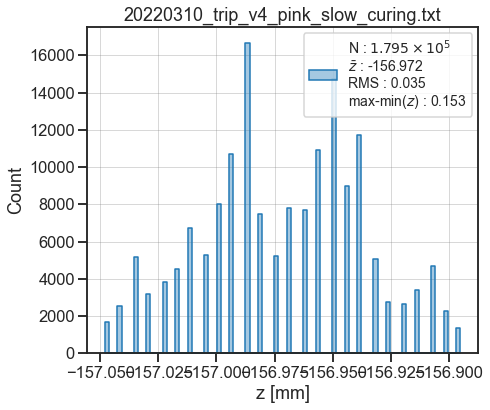

In [22]:
v4_data_pt = tdu.laser_data_analysis(meas_id_sig, #* meas signal
                                           meas_id_bg, #* meas bg
                                           meta_data, 
                                           folder='triplets',
                                            bg_data_check=True, 
                                            sig_data_check=True,
                                            print_removed_points=True,
                                            )

In [23]:
result_df= tdu.calc_flats_statistic_df(v4_data_pt)
result_df.tail()

,R,deltaR,RMS,unix_time,run_nr,datetime,time_h,odd_runs
21,91.427156,4.114539,15.391196,1646989032,22,2022-03-11 09:57:12.197306624+01:00,22.156389,0
22,88.381702,4.093638,15.433927,1646991824,23,2022-03-11 10:43:44.070549504+01:00,22.931944,1
23,88.947552,4.157536,15.309364,1646993988,24,2022-03-11 11:19:48.226425856+01:00,23.533056,0
24,91.122378,4.099217,15.295126,1646996151,25,2022-03-11 11:55:51.444011520+01:00,24.133889,1
25,89.018065,4.076478,15.272172,1646998317,26,2022-03-11 12:31:57.620020992+01:00,24.735556,0


(curing, vac off)


c:\Users\Domin\Nextcloud\Master\Disk_Tiling_Measurements\MADMAX_disk_analysis\analysis_notebooks\disk_analysis_tools\tiling_disk_plots.py:113: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize,  constrained_layout=False)


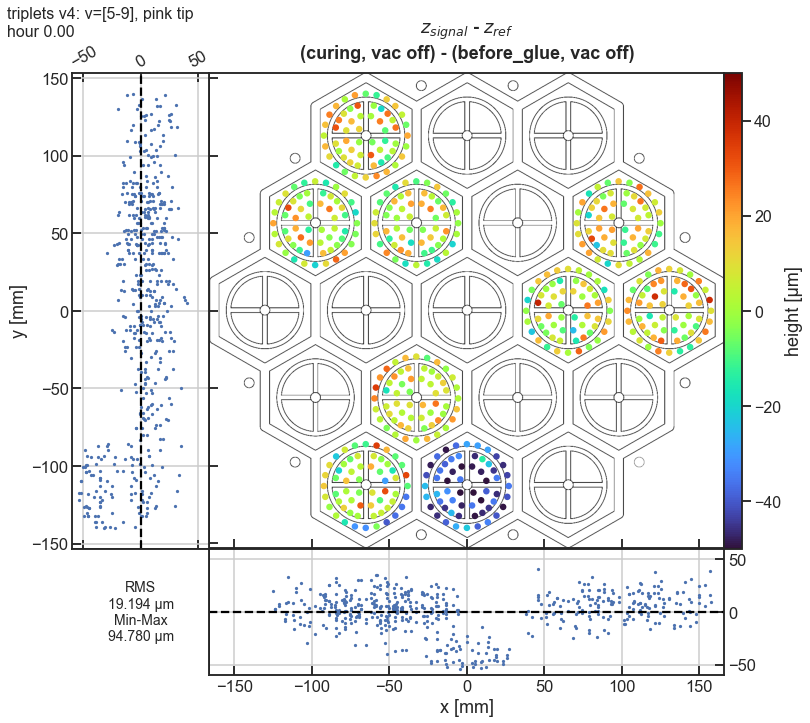

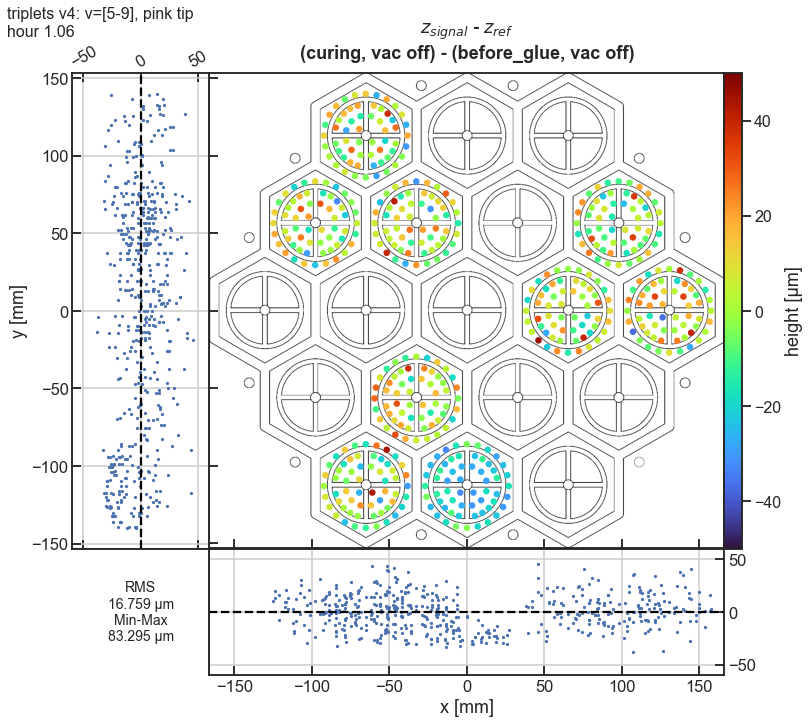

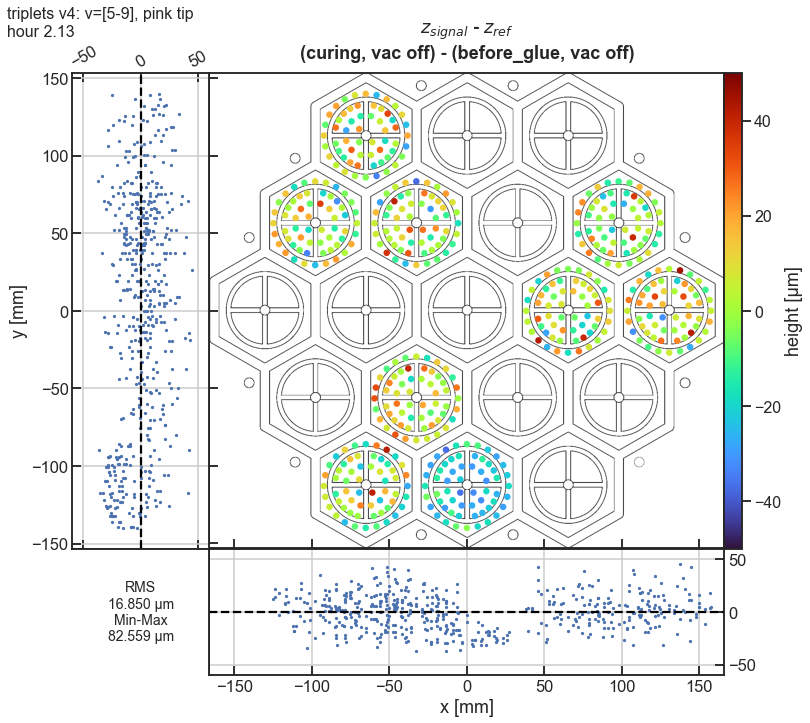

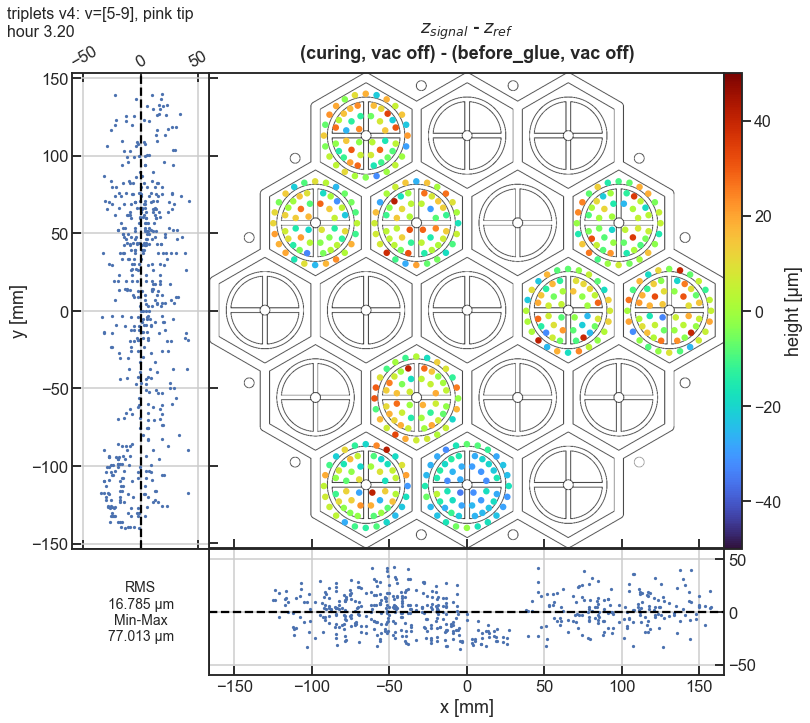

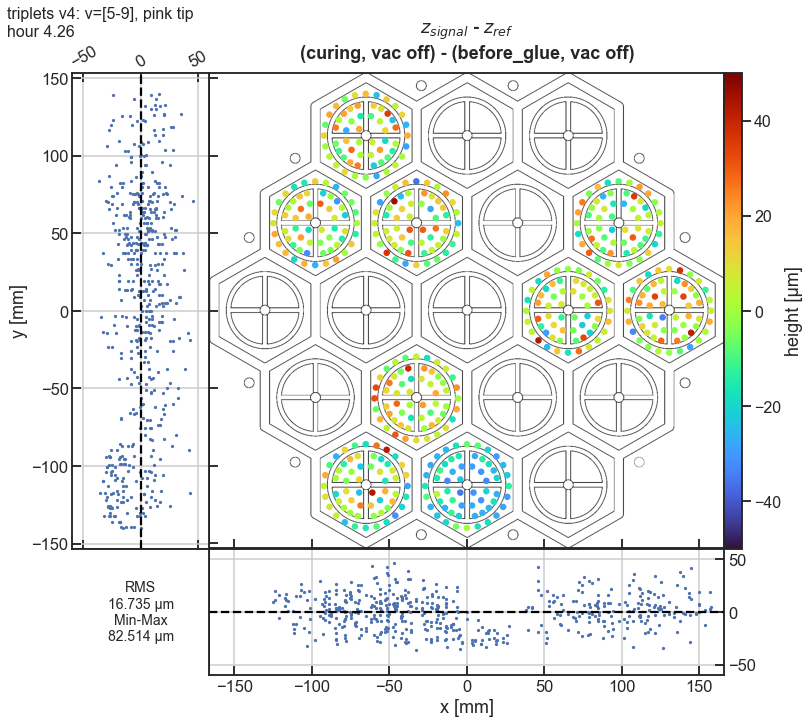

...

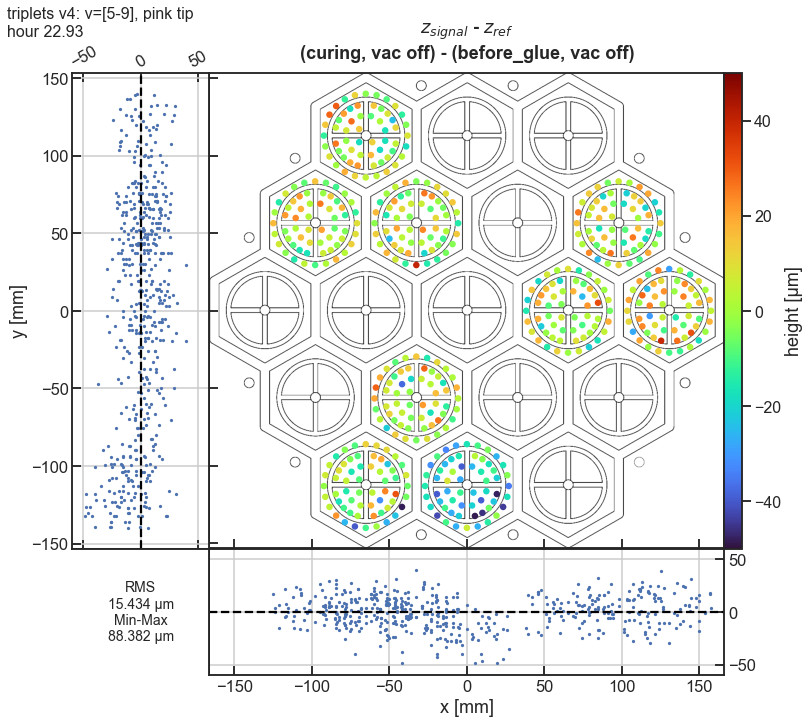

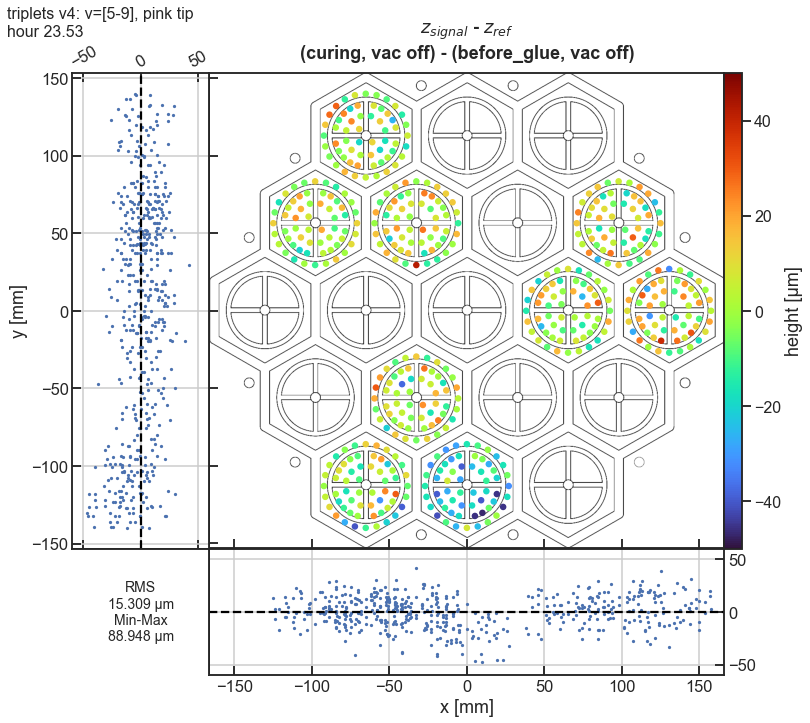

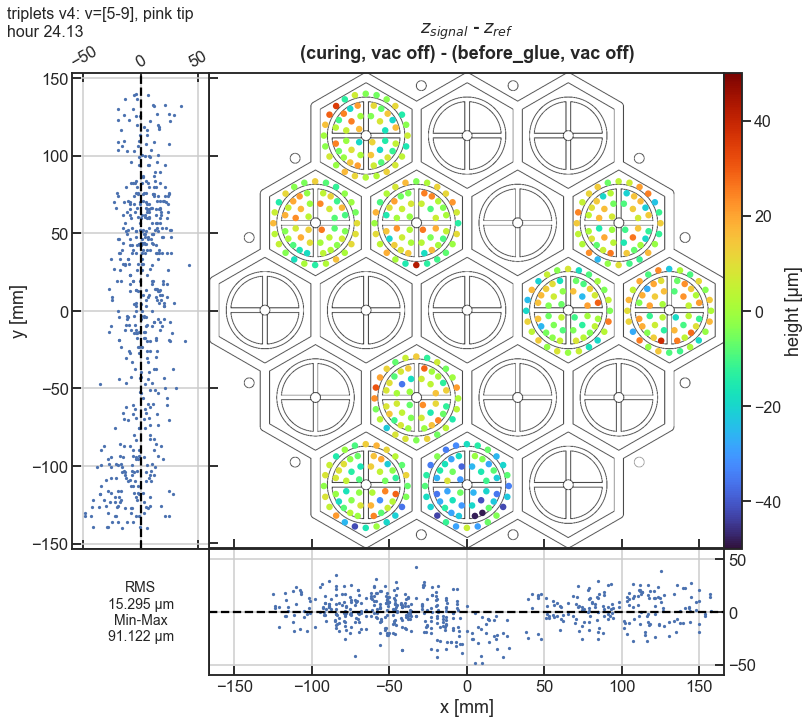

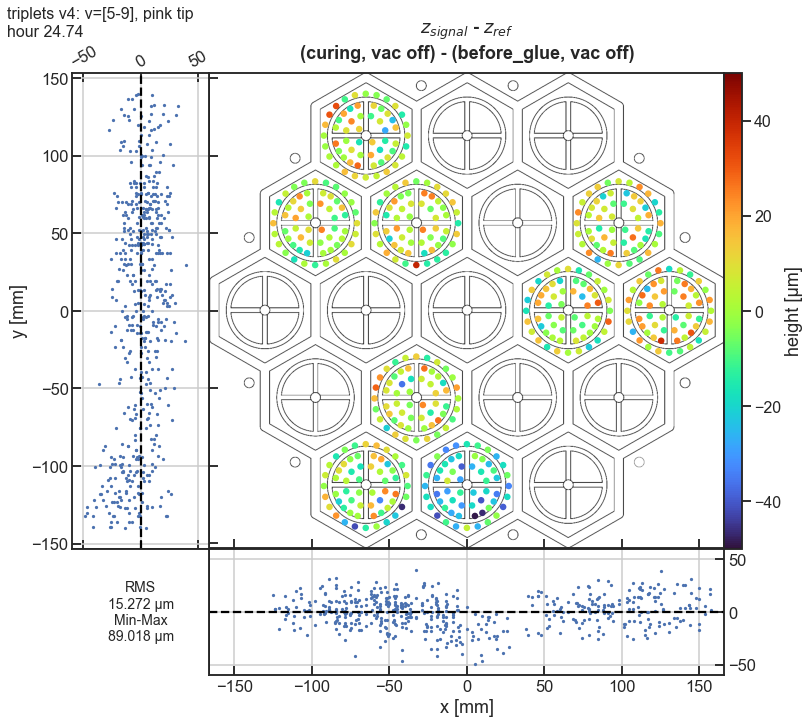

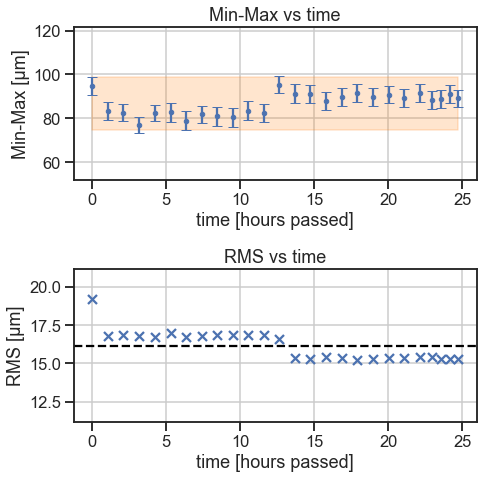

In [26]:
tdp.plot_analysis_results(exp_id, #*exp id
                          v4_data_pt, #* measurements dict
                          exp_db, #* experiments database
                          meta_data, #* meta data df
                          meas_id_sig= meas_id_sig,
                          meas_id_bg = meas_id_bg,
                        #   plot_runs=[1,2,24,25],
                          joyplot=False,hexagon_flatness=True, R_vs_t=True, triplet=False)

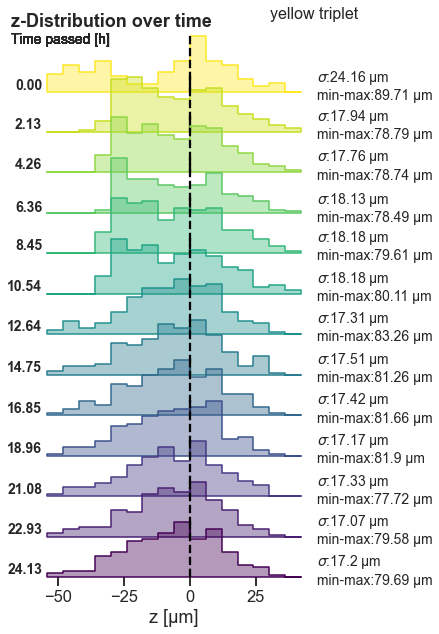

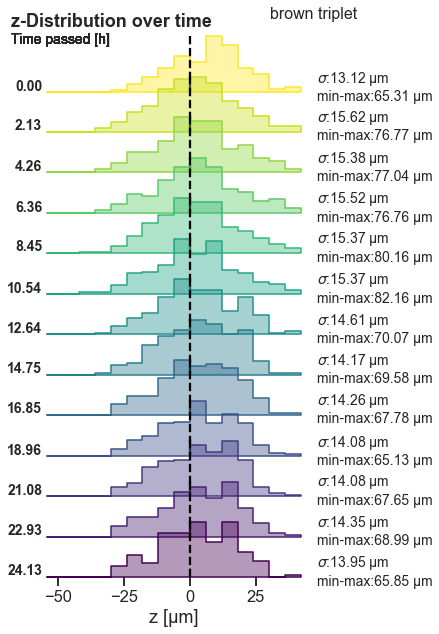

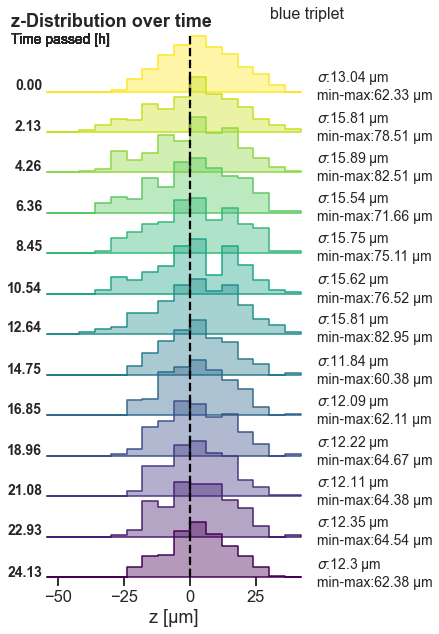

In [25]:
tdp.plot_analysis_results(exp_id, #*exp id
                          v4_data_pt, #* measurements dict
                          exp_db, #* experiments database
                          meta_data, #* meta data df
                          meas_id_sig= meas_id_sig,
                          meas_id_bg = meas_id_bg,
                          plot_runs=[1,24,25,26,27,49],
                          joyplot=True,hexagon_flatness=False, R_vs_t=False, triplet=True, joyplot_summary_stats=True)